# ADS Final Project

## Preliminary EDA

In [716]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
import dmba
from pathlib import Path
import datetime
from dateutil.parser import parse
import statsmodels.api as sm
#import statsmodels.formula.api as smf
from sklearn.metrics import accuracy_score
import plotly.express as px
import plotly.io as pio
from pandas import read_csv
import datetime
from numpy import log
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error
from dateutil.parser import parse
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from pandas.plotting import autocorrelation_plot
from pmdarima.arima import auto_arima
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import r2_score, mean_absolute_error
from prettytable import PrettyTable
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
Retail_df = pd.read_csv('Online_Retail.csv')
Retail_df.sample(5)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
71850,542216,22983,CARD BILLBOARD FONT,12,1/26/2011 12:29,0.42,14911.0,EIRE
187279,552958,21174,POTTERING IN THE SHED METAL SIGN,12,5/12/2011 12:49,2.08,15498.0,United Kingdom
159144,550326,21212,PACK OF 72 RETROSPOT CAKE CASES,1,4/17/2011 13:05,0.55,14532.0,United Kingdom
249707,558906,82483,WOOD 2 DRAWER CABINET WHITE FINISH,2,7/4/2011 16:35,6.95,15555.0,United Kingdom
272433,560772,22720,SET OF 3 CAKE TINS PANTRY DESIGN,1,7/20/2011 16:12,10.79,NaN,United Kingdom


In [39]:
Retail_df.shape

(541909, 8)

In [4]:
Retail_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [6]:
Retail_df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


----

### Data Cleaning

#### Check for nulls

In [103]:
Retail_noNA = Retail_df.dropna()

In [406]:

pio.renderers.default='notebook'

dfg = Retail_noNA.groupby(['Description']).size().to_frame().sort_values([0], 
                                                                         ascending = False).head(10).
                                                                                reset_index()
dfg.columns = ['Description', 'count']
fig = px.histogram(dfg, x='Description', y = 'count',
                  title='Top Ten Item Descriptions Purchased on the Site')
fig.layout.yaxis.title.text = 'count'
fig.show()

missing values are not related to the forecast problem variables being used:

In [101]:
Retail_df.isnull().values.any()

True

In [102]:
Retail_df.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

#### Remove transactions that have to do with returns:

In [719]:


# Remove transactions that were later returned with a negative
# quantity, so find the negative quantities, then
# the matching purchase for that return and remove both records 
# from the data

# But first, make a copy of the dataframe to be modified:

Retail_df_NR = Retail_df.copy()

outlier_rows = Retail_df_NR['Quantity']< 0
outlier=Retail_df_NR[outlier_rows]
outlier

outlierI=outlier.copy()
# find records with negative of the negative quantity (positive)
outlierI['Quantity'] = -outlier['Quantity']

# Combine the data for invoice numbers for purchases that match
# Return invoices with negative quantity values:
commondf=pd.merge(Retail_df_NR,outlierI, on=['StockCode','CustomerID','Quantity'])
commondf = commondf.rename(columns={'InvoiceNo_x': 'InvoiceNo'})

vector_invoices=commondf['InvoiceNo']
b=commondf.iloc[:,0].values
c=commondf.iloc[:,1].values

for i in range(0,len(b)):
    invoice_I = (Retail_df_NR['InvoiceNo'] == b[i]) & (Retail_df_NR['StockCode'] == c[i])
    if Retail_df_NR[invoice_I].empty:
        print('')
    else:

        invoice_I2=Retail_df_NR[invoice_I].index   
        Retail_df_NR=Retail_df_NR.drop(invoice_I2, axis=0)


#Retail_df_NR.shape    
    

Matrix Generated that combines the original transaction with it's Return counterpart:

In [201]:
# This was used to remove all the transactions 
# that were actually refunded so as to not include false
# sales in our forecast.

# The matching item returns are found by matching CustomerID,
# Item StockCode, and Quantity inverted. 

commondf.head()

,InvoiceNo,StockCode,Description_x,Quantity,InvoiceDate_x,UnitPrice_x,CustomerID,Country_x,InvoiceNo_y,Description_y,InvoiceDate_y,UnitPrice_y,Country_y
0,536366,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 8:28,1.85,17850.0,United Kingdom,C543611,HAND WARMER RED RETROSPOT,2/10/2011 14:38,1.85,United Kingdom
1,536372,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 9:01,1.85,17850.0,United Kingdom,C543611,HAND WARMER RED RETROSPOT,2/10/2011 14:38,1.85,United Kingdom
2,536377,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 9:34,1.85,17850.0,United Kingdom,C543611,HAND WARMER RED RETROSPOT,2/10/2011 14:38,1.85,United Kingdom
3,536399,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 10:52,1.85,17850.0,United Kingdom,C543611,HAND WARMER RED RETROSPOT,2/10/2011 14:38,1.85,United Kingdom
4,536407,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 11:34,1.85,17850.0,United Kingdom,C543611,HAND WARMER RED RETROSPOT,2/10/2011 14:38,1.85,United Kingdom


In [199]:
# new size of the retail data:
Retail_df_NR.shape

(532960, 8)

In [200]:
# Since the for loop to get rid of
# returns lasted too long, saved the data
# for future reference on modeling etc:

Retail_df_NR.to_csv('Retail_NoReturn_Transactions.csv')

In [ ]:
p=sns.jointplot(x='vote_average',y='vote_count', data=Retail_df)
p.fig.suptitle("Relationship between Vote_Average and Vote_Count in Movie MetaData")

#### Remove Irrelevant and Unrealistic Records:

These have to do with fees, postage, and adjusted debt/credit transactions, not retail orders

In [202]:

# Remove rows with negative quantities - these were used during adjustments
unreal_rows1 = Retail_df_NR[Retail_df_NR['Quantity'] <= 0].index


Retail_df_pre3 = Retail_df_pre2.drop(index=unreal_rows3)
unreal_rows4 = Retail_df_pre3[(Retail_df_pre3['StockCode'] == 'AMAZONFEE') |
                             (Retail_df_pre3['StockCode'] == 'DOT') |
                             (Retail_df_pre3['StockCode'] == 'M') |
                             (Retail_df_pre3['StockCode'] == 'B') |
                             (Retail_df_pre3['StockCode'] == 'POST')].index

Retail_df_pre4 = Retail_df_pre3.drop(index=unreal_rows4)



Data after removing both returns and irrelevant transactions that have nothing to do with sales:

In [203]:
Retail_df_pre4.describe()

,Quantity,UnitPrice,CustomerID
count,519966.000000,519966.000000,391016.000000
mean,10.171529,3.235760,15300.029428
std,36.451073,4.165506,1709.264898
min,1.000000,0.001000,12347.000000
25%,1.000000,1.250000,13971.000000
50%,3.000000,2.080000,15159.000000
75%,11.000000,4.130000,16800.000000
max,4800.000000,649.500000,18287.000000


In [204]:
Retail_df_pre4.shape

(519966, 8)

In [243]:
Retail_TimeSeries_df=Retail_df_pre4.copy()

In [244]:
Retail_TimeSeries_df.isna().sum()

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     128950
Country             0
dtype: int64

#### Feature engineering SalesTotal:

In [245]:
Retail_TimeSeries_df['Sales'] = (Retail_TimeSeries_df['Quantity'] * Retail_TimeSeries_df['UnitPrice'])

---

### Exploratory Data Analysis

#### Observe time series and distributions based on size of orders

In [253]:
rows_small_orders = (Retail_TimeSeries_df['Quantity'] < 100)
Retail_df_small_orders = Retail_TimeSeries_df[rows_small_orders]
Retail_df_small_orders.shape

(513663, 9)

In [221]:
rows_medlarge_orders = (Retail_TimeSeries_df['Quantity'] >= 100) & 
                                    (Retail_TimeSeries_df['Quantity'] < 1000)
Retail_df_medlarge_orders = Retail_TimeSeries_df[rows_medlarge_orders]
Retail_df_medlarge_orders.shape

(6201, 9)

In [222]:
rows_large_orders = Retail_TimeSeries_df['Quantity'] >= 1000
Retail_df_large_orders = Retail_TimeSeries_df[rows_large_orders]

In [223]:
Retail_df_large_orders.shape

(102, 9)

#### Small order distributions (under 100 units)

In [405]:
dfg_small_order = Retail_df_small_orders.groupby(['Description']).size().to_frame().
                                    sort_values([0], ascending = False).head(10).reset_index()
dfg_small_order.columns = ['Description', 'count']
fig = px.histogram(dfg_small_order, x='Description', y = 'count',
                  title='Top Ten Item Descriptions Purchased on Small Size orders')
fig.layout.yaxis.title.text = 'count'
fig.show()

Text(0.5, 0.98, 'Histograms for orders under 100')

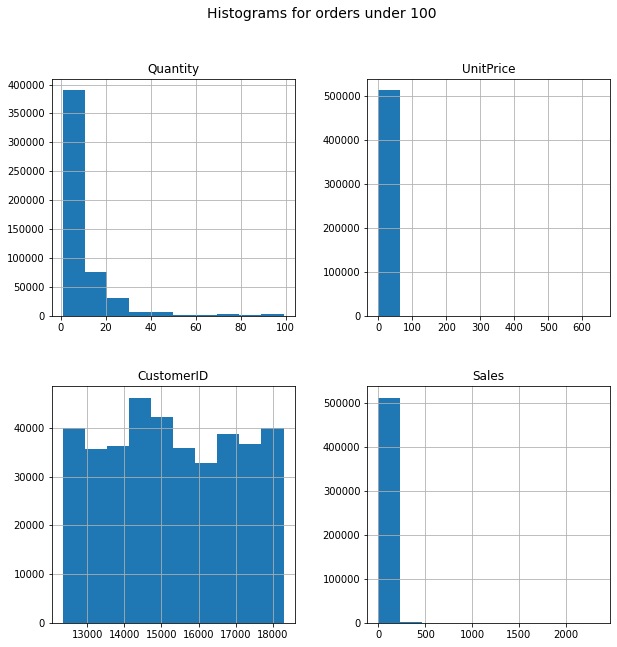

In [256]:
Retail_df_small_orders.hist(figsize=[10,10])
plt.suptitle("Histograms for orders under 100", fontsize=14)

#### Large (>1000) order distributions:

In [407]:
dfg_large_order = Retail_df_large_orders.groupby(['Description']).size().to_frame().sort_values([0], 
                                                                    ascending = False).head(10).reset_index()
dfg_large_order.columns = ['Description', 'count']
fig = px.histogram(dfg_large_order, x='Description', y = 'count',
                  title='Top Ten Item Descriptions Purchased on Large Size orders')
fig.layout.yaxis.title.text = 'count'
fig.show()

Text(0.5, 0.98, 'Histograms for orders over 1000')

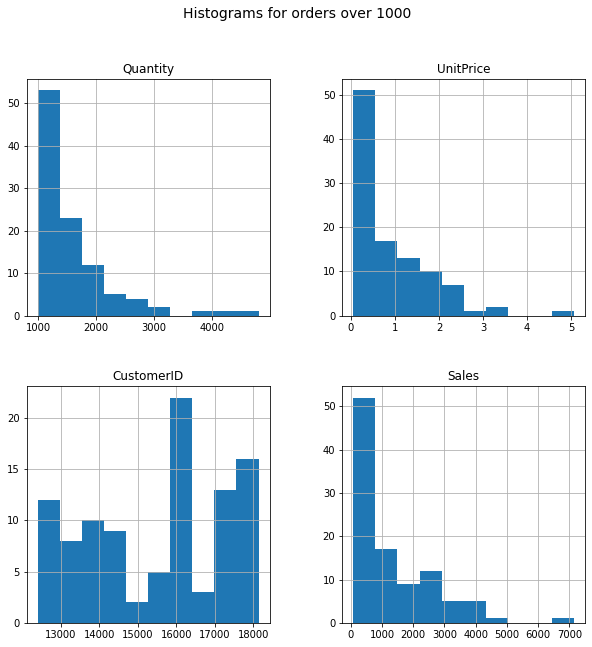

In [224]:
Retail_df_large_orders.hist(figsize=[10,10])
plt.suptitle("Histograms for orders over 1000", fontsize=14)


In [225]:
Retail_df_large_orders.to_csv('Retail_df_large_orders.csv')

#### Medium (100-1000 units) order Distributions:

In [408]:
dfg_medium_order = Retail_df_medlarge_orders.groupby(['Description']).size().to_frame().
                                                sort_values([0], ascending = False).head(10).reset_index()
dfg_medium_order.columns = ['Description', 'count']
fig = px.histogram(dfg_medium_order, x='Description', y = 'count',
                  title='Top Ten Item Descriptions Purchased on Medium Size orders')
fig.layout.yaxis.title.text = 'count'
fig.show()

Text(0.5, 0.98, 'Histograms for orders over 100 but less than 1000')

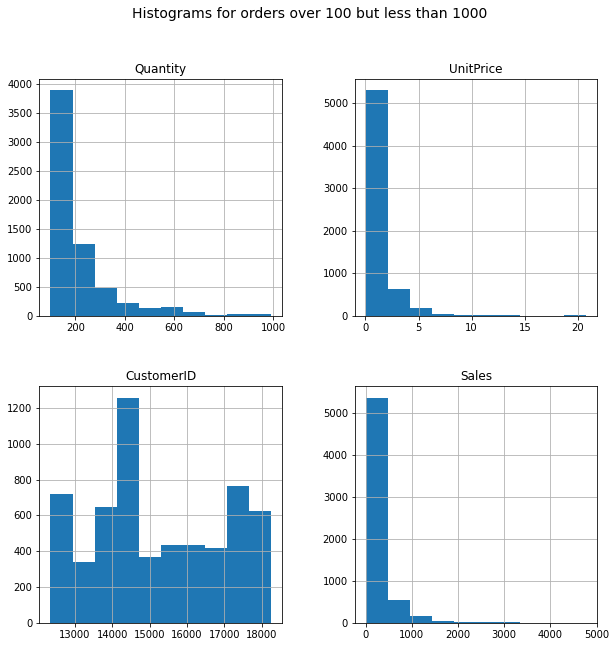

In [226]:
Retail_df_medlarge_orders.hist(figsize=[10,10])
plt.suptitle("Histograms for orders over 100 but less than 1000", fontsize=14)

#### Most popular items purchased:

In [409]:

pio.renderers.default='notebook'

dfg = Retail_TimeSeries_df.groupby(['Description']).size().to_frame().sort_values([0], 
                                                            ascending = False).head(10).reset_index()
dfg.columns = ['Description', 'count']
fig = px.histogram(dfg, x='Description', y = 'count',
                  title='Top Ten Item Descriptions Purchased on the Site')
fig.layout.yaxis.title.text = 'count'
fig.show()

In [233]:
MostCommonItem = Retail_TimeSeries_df[Retail_TimeSeries_df['Description'].
                                      str.contains('WHITE HANGING HEART T-LIGHT HOLDER', 
                                                   na=False)]

In [234]:
MostCommonItem.shape

(2293, 9)

In [236]:
MostCommonItem.describe()

,Quantity,UnitPrice,CustomerID,Sales
count,2293.000000,2293.000000,1998.000000,2293.000000
mean,14.501526,3.221029,15558.954454,41.273973
std,43.009513,0.995402,1618.141817,129.383443
min,1.000000,2.550000,12370.000000,2.950000
25%,3.000000,2.950000,14221.000000,8.850000
50%,6.000000,2.950000,15584.000000,17.700000
75%,12.000000,2.950000,16931.000000,35.400000
max,1010.000000,6.770000,18283.000000,3272.400000


In [238]:
MostCommonItem.Sales.sum()

94641.22

#### Particular item order Distributions: Clocks

In [227]:
clock = Retail_TimeSeries_df[Retail_TimeSeries_df['Description'].str.contains('CLOCK', 
                                                                              na=False)]

In [441]:
clock.shape

(7025, 9)

In [259]:
clock_test = Retail_df_small_orders[Retail_df_small_orders['Description'].str.contains('CLOCK', 
                                                                                       na=False)]
clock_test.shape

(6990, 9)

**Most clock sales come from small orders with some coming from medium sized orders**

In [219]:
clock.shape

(7025, 8)

In [237]:
clock.describe()

,Quantity,UnitPrice,CustomerID,Sales
count,7025.000000,7025.000000,5726.000000,7025.000000
mean,5.303203,6.096231,15250.322040,23.958272
std,18.973171,3.737963,1739.507654,76.379316
min,1.000000,0.190000,12347.000000,0.190000
25%,1.000000,3.750000,13767.000000,8.290000
50%,2.000000,3.750000,15178.000000,15.000000
75%,4.000000,8.500000,16729.000000,19.900000
max,620.000000,49.960000,18280.000000,2662.200000


In [239]:
clock.Sales.sum()

168306.86000000002

#### Sales from clocks alone amount to a total of 168,306 as opposed to the most popular item that amounts to 94,641 and with projected interest in clocks going up, must look at initial forecasts for this item.

Text(0.5, 0.98, 'Histograms for orders of Clocks')

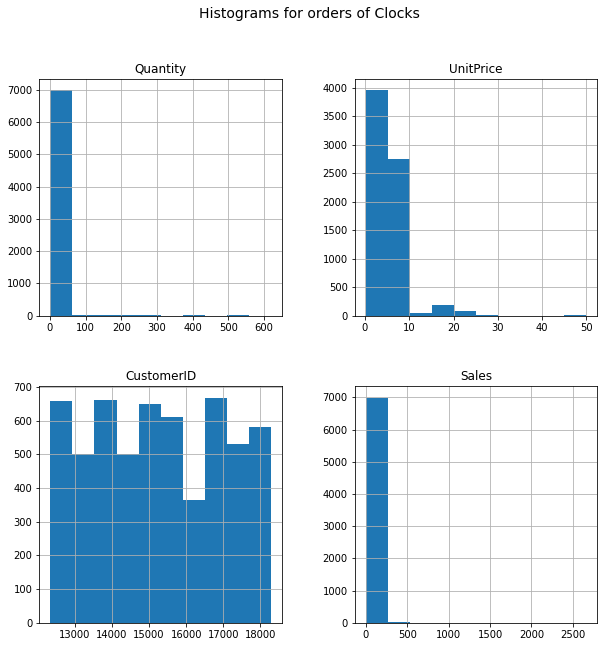

In [228]:
clock.hist(figsize=[10,10])
plt.suptitle("Histograms for orders of Clocks", fontsize=14)

In [ ]:
clock['Clock_Purchase'] = 1

#### Relationship between Sales and other variables

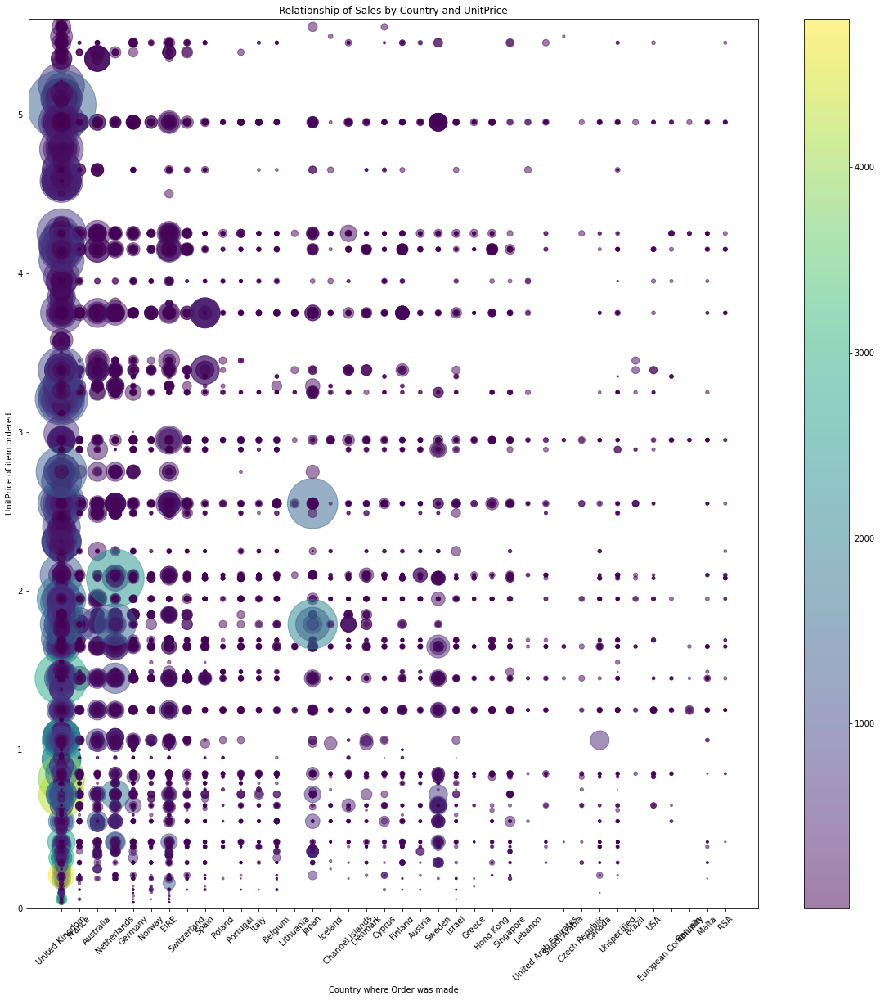

In [264]:
plt.figure(figsize=(20,20))
plt.scatter(Retail_TimeSeries_df['Country'], Retail_TimeSeries_df['UnitPrice'], 
            s=Retail_TimeSeries_df['Sales'], c=Retail_TimeSeries_df['Quantity'], 
            alpha=0.5
           )
plt.gca().update(dict(title='Relationship of Sales by Country and UnitPrice', 
                      xlabel='Country where Order was made', ylabel='UnitPrice of item ordered', 
                      ylim=(0,5.6)))
plt.xticks(rotation=45)
plt.colorbar()
plt.show()

**Most orders are from the UK and most are small size orders (darker purple). Large Sale values span the unit price range.**

### Time Series Plots

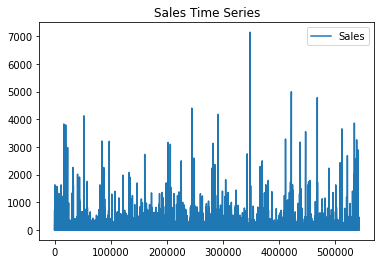

In [247]:
Retail_SalesOnly = Retail_TimeSeries_df.copy()
Retail_SalesOnly.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity'],
                      inplace=True)

Retail_Sales.plot()
plt.title('Sales Time Series')
plt.show()

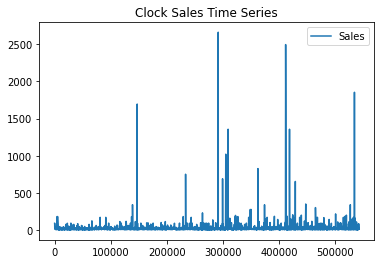

In [248]:
Clock_SalesOnly = clock.copy()
Clock_SalesOnly.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity'],
                     inplace=True)

Clock_SalesOnly.plot()
plt.title('Clock Sales Time Series')
plt.show()

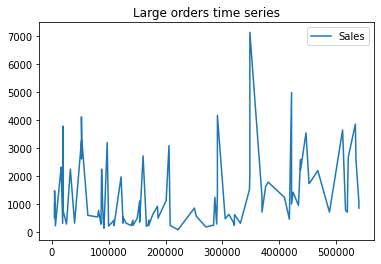

In [249]:

series_time_retail = read_csv('Retail_df_large_orders.csv', header=0, index_col=0, parse_dates=True, 
                              squeeze=True)
series_time_retail.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity'],
                        inplace=True)

series_time_retail.plot()
plt.title('Large orders time series')
plt.show()

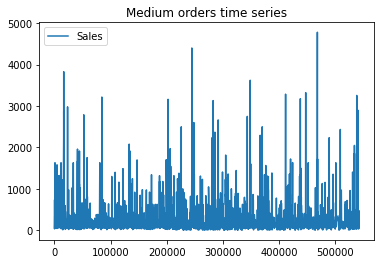

In [250]:
series_time_retail2 = Retail_df_medlarge_orders.copy()
series_time_retail2.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity'],
                         inplace=True)

series_time_retail2.plot()
plt.title('Medium orders time series')
plt.show()

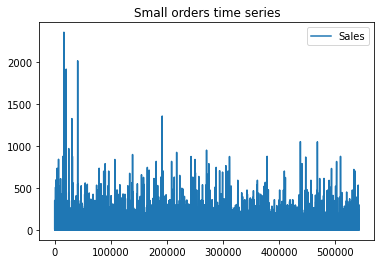

In [260]:
series_time_retail3 = Retail_df_small_orders.copy()
series_time_retail3.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity'],
                         inplace=True)

series_time_retail3.plot()
plt.title('Small orders time series')
plt.show()

* Most orders originate from the UK, which is where the company is based
* Most sales are small quantities (purple color)

----

### Clock Modeling Pre-Processing Sales Data Set:

Time series by Date:

In [410]:
clock.to_csv('Clock_Retail_UKdata.csv')

In [411]:
Clock_TimeSeries_date_df = read_csv('Clock_Retail_UKdata.csv', header=0, index_col=0, 
                                    parse_dates=True, squeeze=True)
Clock_TimeSeries_date_df['InvoiceDate'] = pd.to_datetime(Clock_TimeSeries_date_df['InvoiceDate'])   

Clock_TimeSeries_date_df=Clock_TimeSeries_date_df.set_index('InvoiceDate')

In [412]:
Clock_TimeSeries_date_df.head()

,InvoiceNo,StockCode,Description,Quantity,UnitPrice,CustomerID,Country,Sales
InvoiceDate,,,,,,,,
2010-12-01 08:45:00,536370,22728,ALARM CLOCK BAKELIKE PINK,24,3.75,12583.0,France,90.0
2010-12-01 08:45:00,536370,22727,ALARM CLOCK BAKELIKE RED,24,3.75,12583.0,France,90.0
2010-12-01 08:45:00,536370,22726,ALARM CLOCK BAKELIKE GREEN,12,3.75,12583.0,France,45.0
2010-12-01 09:45:00,536382,22726,ALARM CLOCK BAKELIKE GREEN,4,3.75,16098.0,United Kingdom,15.0
2010-12-01 10:03:00,536389,22193,RED DINER WALL CLOCK,2,8.50,12431.0,Australia,17.0


Focus only on UK sales:

In [413]:
Clock_TimeSeries_date_df = Clock_TimeSeries_date_df[Clock_TimeSeries_date_df['Country'].str.contains('United Kingdom', 
                                                                                                     na=False)]

In [426]:
Clock_TimeSeries_date_df.head()

,InvoiceNo,StockCode,Description,Quantity,UnitPrice,CustomerID,Country,Sales
InvoiceDate,,,,,,,,
2010-12-01 09:45:00,536382,22726,ALARM CLOCK BAKELIKE GREEN,4,3.75,16098.0,United Kingdom,15.0
2010-12-01 10:47:00,536395,22730,ALARM CLOCK BAKELIKE IVORY,4,3.75,13767.0,United Kingdom,15.0
2010-12-01 10:47:00,536395,22727,ALARM CLOCK BAKELIKE RED,8,3.75,13767.0,United Kingdom,30.0
2010-12-01 10:47:00,536395,22729,ALARM CLOCK BAKELIKE ORANGE,8,3.75,13767.0,United Kingdom,30.0
2010-12-01 10:47:00,536395,22726,ALARM CLOCK BAKELIKE GREEN,8,3.75,13767.0,United Kingdom,30.0


<Figure size 432x288 with 0 Axes>

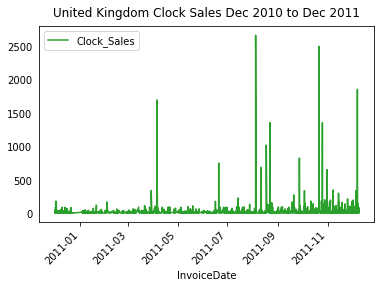

In [720]:
UK_clock_ts = Clock_TimeSeries_date_df.copy()
UK_clock_ts.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity',
                         'StockCode','Description','Country'],inplace=True)
plt.figure(figsize=(6,4))
UK_clock_ts.plot(color='tab:green')
plt.title('United Kingdom Clock Sales Dec 2010 to Dec 2011')
plt.xticks(rotation=45)
plt.legend(['Clock_Sales'])
plt.show()


**Sales per Day:**

In [416]:
UK_clock_ts.head()

,Sales
InvoiceDate,
2010-12-01 09:45:00,15.0
2010-12-01 10:47:00,15.0
2010-12-01 10:47:00,30.0
2010-12-01 10:47:00,30.0
2010-12-01 10:47:00,30.0


In [417]:
UK_clock_ts.shape

(6281, 1)

**Clock Dataset with only Daily Sales and Date Index:**

In [418]:
UK_DailyClock_ts = UK_clock_ts.iloc[:,0].resample('d').sum()

In [443]:
UK_DailyClock_df=pd.DataFrame(UK_DailyClock_ts)

In [444]:
UK_DailyClock_df.head()

,Sales
InvoiceDate,
2010-12-01,568.40
2010-12-02,747.25
2010-12-03,587.62
2010-12-04,0.00
2010-12-05,547.25


In [596]:
UK_DailyClock_df = UK_DailyClock_df[UK_DailyClock_df['Sales'] > 1]

<Figure size 432x288 with 0 Axes>

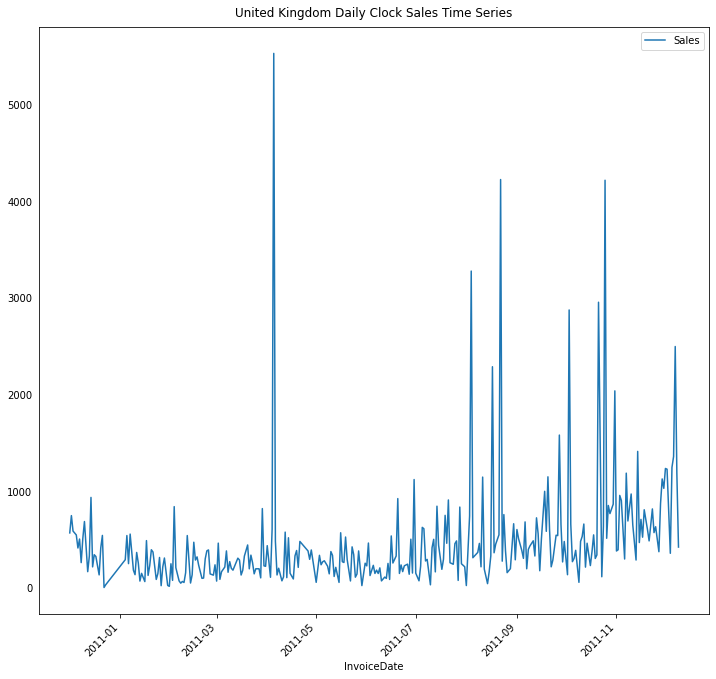

In [723]:
plt.figure(figsize=(6,4))
UK_DailyClock_df.plot()

plt.title('United Kingdom Daily Clock Sales Time Series')
plt.xticks(rotation=45)
plt.show()

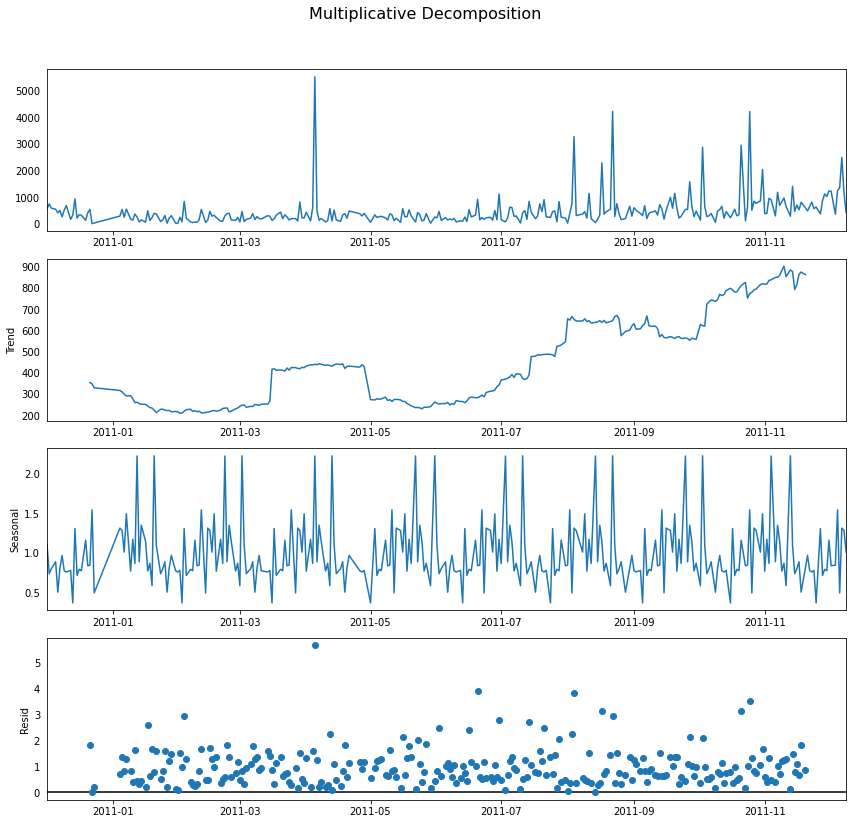

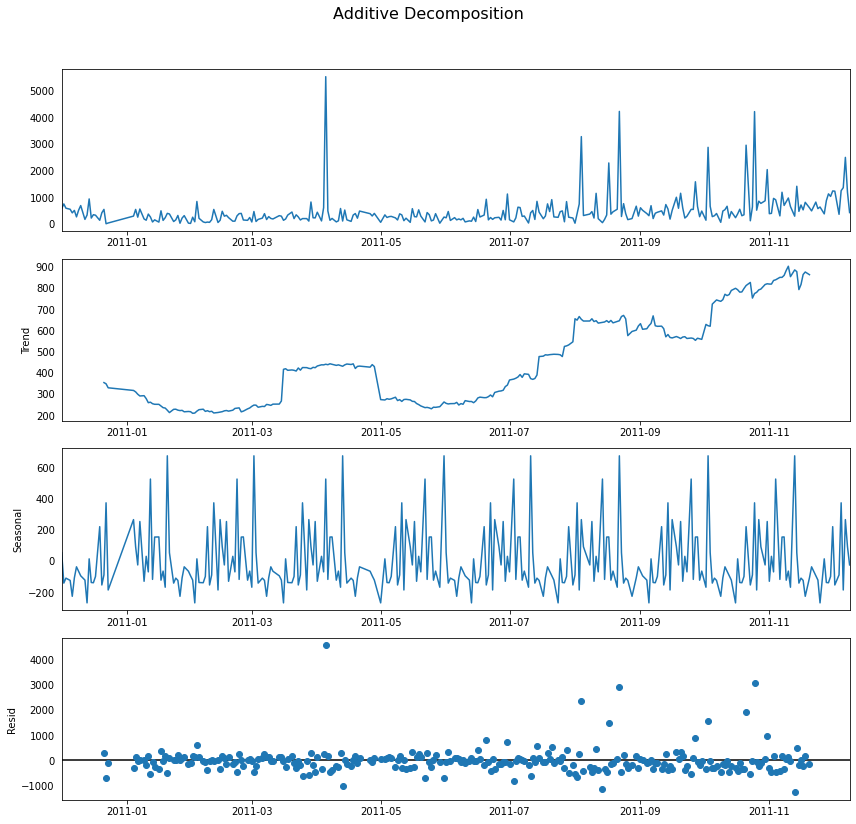

In [724]:
# Decomposition
# Decomposition of a time series can be performed by considering 
# the series as an additive or multiplicative combination of the 
# base level, trend, seasonal index and the residual term.

# Multiplicative Decomposition 
multiplicative_decomposition = seasonal_decompose(UK_DailyClock_df, model='multiplicative', 
                                                  period=35)

# Additive Decomposition
additive_decomposition = seasonal_decompose(UK_DailyClock_df, model='additive', 
                                            period=35)

# Plot
plt.rcParams.update({'figure.figsize': (12,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', 
                                             fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', 
                                       fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

#### If we look at the residuals of the additive decomposition closely, it has some pattern left over.

#### The multiplicative decomposition, looks quite random which is good. So ideally, multiplicative decomposition should be preferred for this particular series.

----

### Stationarity and Correlation Tests on Time Series:

In [599]:
# Check for stationarity and if the signal is a random walk:

result = adfuller(UK_DailyClock_df.dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -4.112281
p-value: 0.000924


* Null Hypothesis: series is non-stationary

* Alternate Hypothesis: series is stationary

    * p-value is < 0.05 so we can reject the null hypothesis.

    * Therefore, the series is stationary

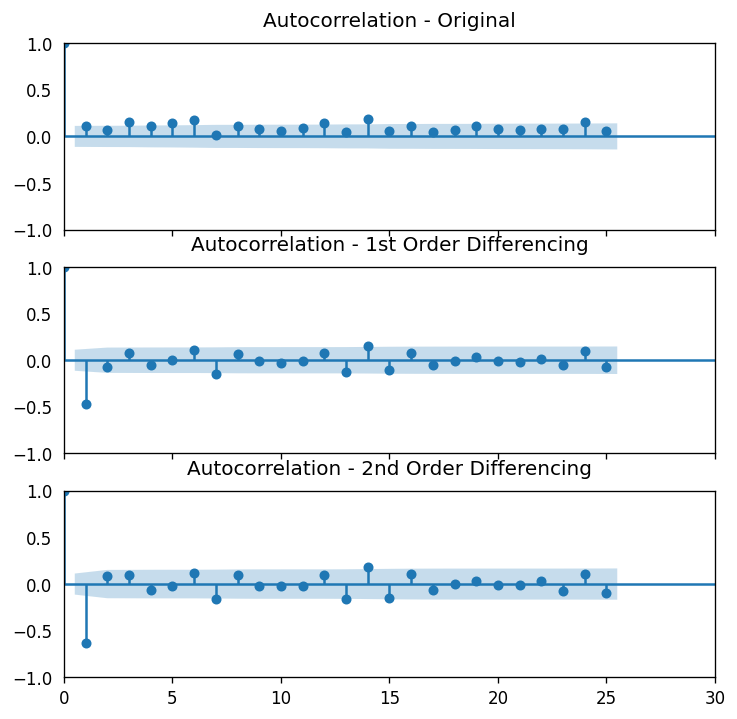

In [725]:
plt.rcParams.update({'figure.figsize':(7,7), 'figure.dpi':120})
# Import data

# Original Series
fig, axes = plt.subplots(3, sharex=True)

plot_acf(UK_DailyClock_df, ax=axes[0])
axes[0].set_title('Autocorrelation - Original')

plot_acf(UK_DailyClock_df.diff().dropna(), ax=axes[1])
axes[1].set_title('Autocorrelation - 1st Order Differencing')

plot_acf(UK_DailyClock_df.diff().diff().dropna(), ax=axes[2])
axes[2].set_title('Autocorrelation - 2nd Order Differencing')

plt.xlim([0, 30])
plt.show()


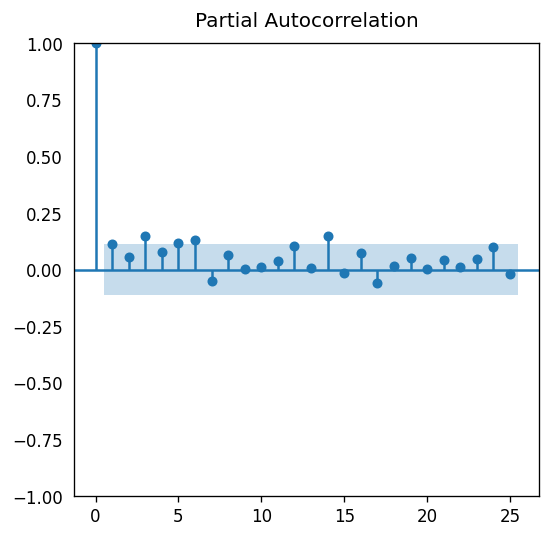

In [727]:
# PACF plot 
plt.rcParams.update({'figure.figsize':(5,5), 'figure.dpi':120})

pacf = plot_pacf(UK_DailyClock_df['Sales'], lags=25)
plt.title('Partial Autocorrelation')
plt.show()


#### The above plot can be used to determine the order of AR model. You may note that a correlation value up to order 3 is high enough. Thus, we will train the AR model of order 3.

#### If partial autocorrelation values are close to 0, then values between observations and lagged observations are not correlated with one another. Inversely, partial autocorrelations with values close to 1 or -1 indicate that there exists strong positive or negative correlations between the lagged observations of the time series.

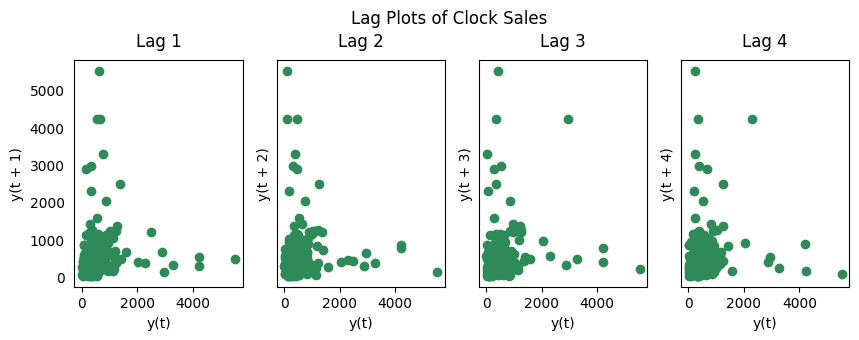

In [684]:
# Lag Plots

from pandas.plotting import lag_plot
plt.rcParams.update({'ytick.left' : False, 'axes.titlepad':10})

# Plot
fig, axes = plt.subplots(1, 4, figsize=(10,3), sharex=True, sharey=True, dpi=100)
for i, ax in enumerate(axes.flatten()[:4]):
    lag_plot(UK_DailyClock_df['Sales'], lag=i+1, ax=ax, c='seagreen')
    ax.set_title('Lag ' + str(i+1))

fig.suptitle('Lag Plots of Clock Sales', y=1.05)    
plt.show()

#### A Lag plot is a scatter plot of a time series against a lag of itself. It is normally used to check for autocorrelation. If there is any pattern existing in the series, the series is autocorrelated. If there is no such pattern, the series is likely to be random white noise.

### Naive Forecast Method

In [687]:
# Split Train / Test

train_length = 243
train = UK_DailyClock_df[0:train_length]
test = UK_DailyClock_df[train_length:]
print(len(train))
print('')
print(len(test))

243

60


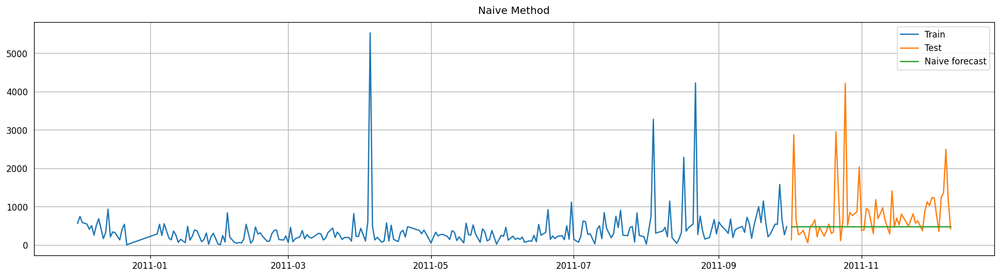

In [689]:
# Naive Forecast

naive = test.copy()
naive['naive_forecast'] = train['Sales'][train_length-1]

plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(naive['naive_forecast'], label='Naive forecast')
plt.legend(loc='best')
plt.title('Naive Method')
plt.show()

In [691]:
n_rmse = np.sqrt(mean_squared_error(test['Sales'], naive['naive_forecast'])).round(2)
n_mape = np.round(np.mean(np.abs(test['Sales']-naive['naive_forecast'])/test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Naive method'], 'MAPE': [n_mape], 'RMSE': [n_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Naive method,816.73,62.92


####  Per the graph naive method is not suitable for data with high variability 

### Simple Average

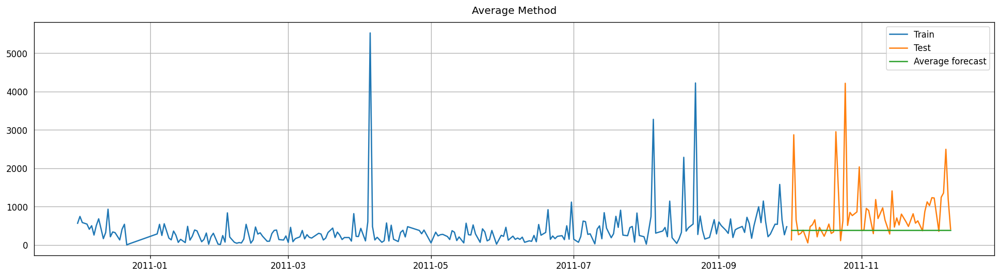

In [692]:
simple_average = test.copy()
simple_average['avg_forecast'] = train['Sales'].mean()

plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(simple_average['avg_forecast'], label='Average forecast')
plt.legend(loc='best')
plt.title('Average Method')
plt.show()

In [694]:
sa_rmse = np.sqrt(mean_squared_error(test['Sales'], simple_average['avg_forecast'])).round(2)
sa_mape = np.round(np.mean(np.abs(test['Sales']-simple_average['avg_forecast'])/test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Average method'], 'MAPE': [sa_mape], 'RMSE': [sa_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Average method,861.06,58.65


#### This model did improve our score, it seems the average of our data is pretty consistent.

### Moving Average

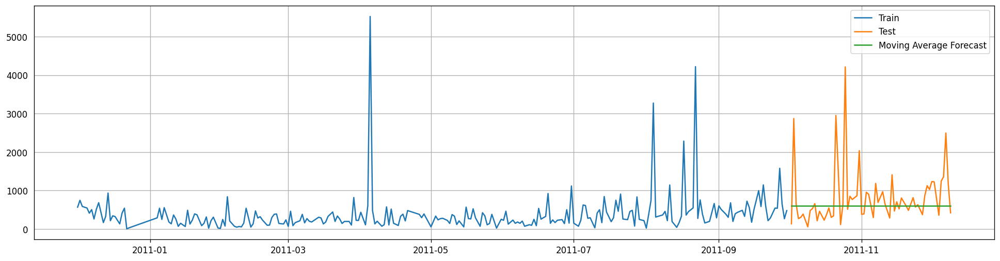

In [695]:
moving_avg = test.copy()
moving_avg['moving_avg_forecast'] = train['Sales'].rolling(60).mean().iloc[-1]

plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(moving_avg['moving_avg_forecast'], label='Moving Average Forecast')
plt.legend(loc='best')
plt.show()

In [697]:
ma_rmse = np.sqrt(mean_squared_error(test['Sales'], moving_avg['moving_avg_forecast'])).round(2)
ma_mape = np.round(np.mean(np.abs(test['Sales']-moving_avg['moving_avg_forecast'])/test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Moving Average method'], 'MAPE': [ma_mape], 'RMSE': [ma_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Moving Average method,771.42,74.26


#### Interestingly enough this model did not improve our results after choosing the last 60 days. We could adjust the window and see if that improves our results. 

### Simple Exponential Smoothing

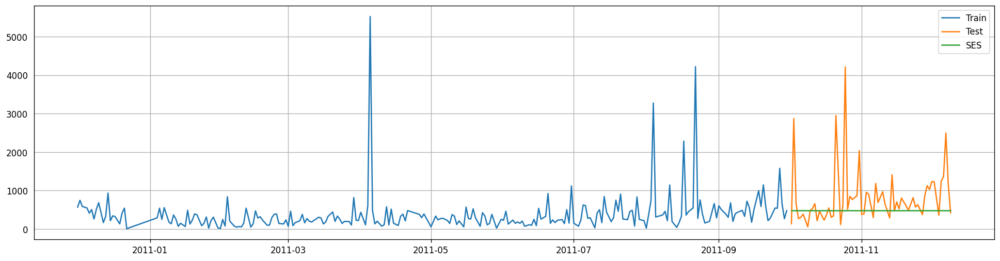

In [698]:
ses = test.copy()
ses_fit = SimpleExpSmoothing(np.asarray(train['Sales'])).fit(smoothing_level=0.6,
                                                             optimized=False)
ses['SES'] = ses_fit.forecast(len(test))

plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(ses['SES'], label='SES')
plt.legend(loc='best')
plt.show()

In [700]:
se_rmse = np.sqrt(mean_squared_error(test['Sales'], ses['SES'])).round(2)
se_mape = np.round(np.mean(np.abs(test['Sales']-ses['SES'])/test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Simple Exponential Smoothing method'], 'MAPE': [se_mape], 
                        'RMSE': [se_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Simple Exponential Smoothing method,812.86,63.55


#### So far the second best model after simple average. We can tune to alpha from 0.6 to another number to see if it helps improve the model. 

### Holt Linear Method (double exponential smoothing)

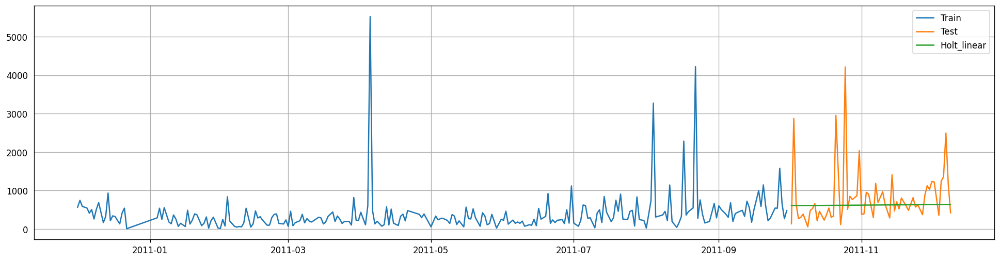

In [701]:
holt = test.copy()
holt_fit = Holt(np.asarray(train['Sales'])).fit(smoothing_level = 0.3, 
                                                smoothing_slope = 0.1)
holt['Holt_linear'] = holt_fit.forecast(len(test))

plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(holt['Holt_linear'], label='Holt_linear')
plt.legend(loc='best')
plt.show()

In [702]:
hl_rmse = np.sqrt(mean_squared_error(test['Sales'], holt['Holt_linear'])).round(2)
hl_mape = np.round(np.mean(np.abs(test['Sales']-holt['Holt_linear'])/test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Holt Linear method'], 'MAPE': [hl_mape], 'RMSE': [hl_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Holt Linear method,764.49,75.43


#### Results were not very good on the first run, model can be tuned to see if there's improvement

### Holt Winters Method

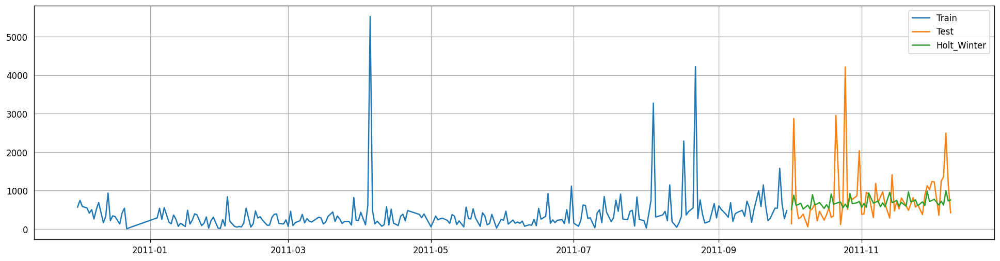

In [703]:
hw = test.copy()
hw_fit = ExponentialSmoothing(np.asarray(train['Sales']) ,seasonal_periods=7 ,
                              trend='add', seasonal='add',).fit()
hw['Holt_Winter'] = hw_fit.forecast(len(test))

plt.figure(figsize=(20,5))
plt.grid()
plt.plot( train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(hw['Holt_Winter'], label='Holt_Winter')
plt.legend(loc='best')
plt.show()

In [705]:
hw_rmse = np.sqrt(mean_squared_error(test['Sales'], hw['Holt_Winter'])).round(2)
hw_mape = np.round(np.mean(np.abs(test['Sales']-hw['Holt_Winter'])/test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Holt Winters method'], 'MAPE': [hw_mape], 'RMSE': [hw_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Holt Winters method,731.7,79.48


#### Acheived better results with RMSE and the signal forecast seems to follow the general shape of the actual validation data.

### ARIMA

#### First on entire dataset:

In [639]:
# Estimate by trial and error:
# that the best p would be 2 based
# on our autocorrelation plots 1 differencing
# since the signal is stationary, and q = 0
# based on partial autocorrelation plots:

modelclks = ARIMA(UK_DailyClock_df, order=(2,1,0))
model_fitclks = modelclks.fit()
print(model_fitclks.summary())

                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  303
Model:                 ARIMA(2, 1, 0)   Log Likelihood               -2383.720
Date:                Fri, 02 Dec 2022   AIC                           4773.439
Time:                        12:01:08   BIC                           4784.571
Sample:                             0   HQIC                          4777.893
                                - 303                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6678      0.029    -22.982      0.000      -0.725      -0.611
ar.L2         -0.4002      0.023    -17.258      0.000      -0.446      -0.355
sigma2      4.221e+05   1.06e+04     39.799      0.0

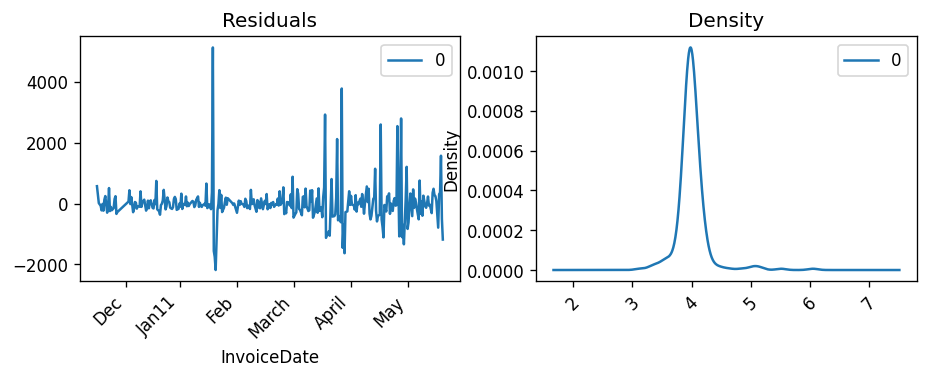

In [640]:
residuals_clks = pd.DataFrame(model_fitclks.resid)
fig, ax = plt.subplots(1,2)
residuals_clks.plot(title="Residuals", ax=ax[0])
ax[0].set_xticklabels(['Dec','Jan11','Feb','March','April','May','June',
                       'July','Aug','Sept','Oct','Nov','Dec'],rotation=45)
residuals_clks.plot(kind='kde', title='Density', ax=ax[1])
ax[1].set_xticklabels([1,2,3,4,5,6,7,8],rotation=45)

plt.show()

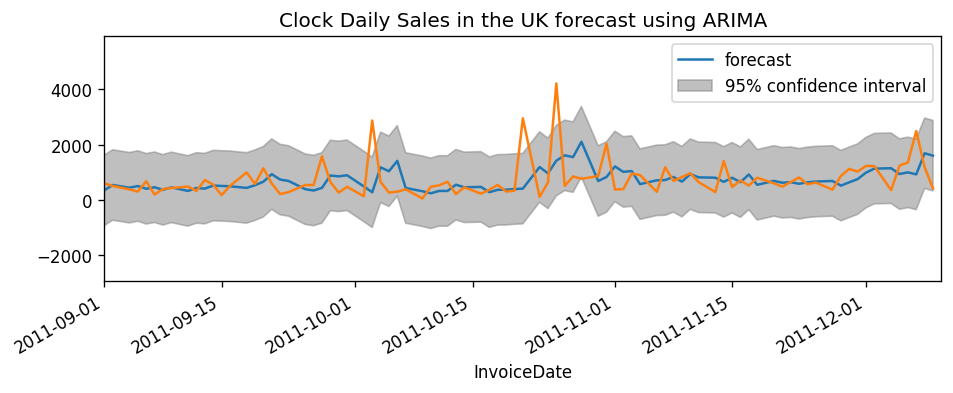

In [641]:
# Actual vs Fitted
plot_predict(model_fitclks)
plt.plot(UK_DailyClock_df)
plt.title('Clock Daily Sales in the UK forecast using ARIMA')
plt.xlim([pd.Timestamp('2011-09-01'), pd.Timestamp('2011-12-10')])
plt.show()

#### ARIMA model appears to be a version of a somewhat delayed and smaller version of the data. The true test is performance on validation.

#### Validation of the ARIMA model:

In [608]:
UK_DailyClock_df.shape

(303, 1)

In [642]:
# Create Training and Test
# Forecast first 9 days of December:
train_clk = UK_DailyClock_df.Sales[:'2011-11-30']
test_clk = UK_DailyClock_df.Sales['2011-12-01':]

##### Attempt Auto Arima for better parameters:

In [706]:
model_clk = auto_arima(train, start_p=1, start_q=1,
 test='adf', # use adftest to find optimal 'd'
 max_p=3, max_q=3, # maximum p and q
 m=1, # frequency of series
 d=None, # let model determine 'd'
 seasonal=False, # No Seasonality
 start_P=0, 
 D=0, 
 trace=True,
 error_action='ignore',
 suppress_warnings=True, 
 stepwise=True)
print(model_clk.summary())                     

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3740.053, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3841.810, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3802.624, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3816.718, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=3741.935, Time=0.34 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=3741.923, Time=0.30 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=3806.975, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=3790.880, Time=0.03 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=3739.021, Time=0.31 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=inf, Time=0.47 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=3743.504, Time=0.31 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=3743.447, Time=0.36 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=3743.269, Time=0.41 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=3

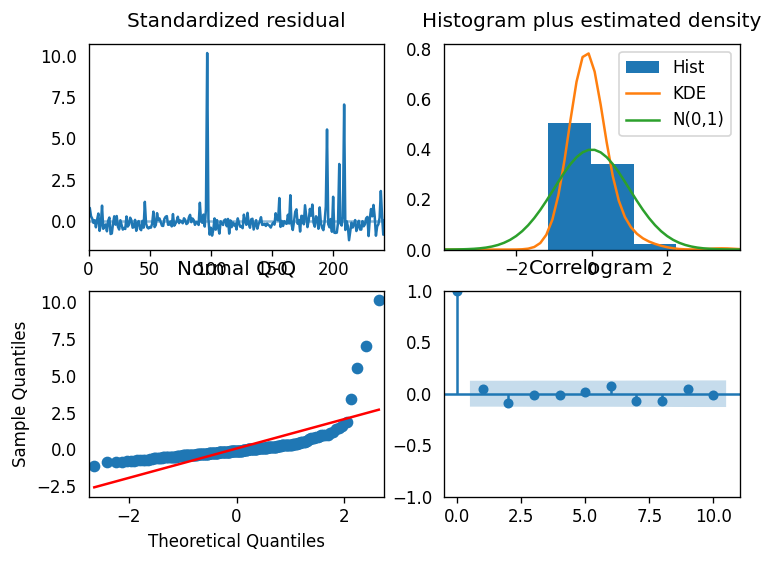

In [707]:
model_clk.plot_diagnostics(figsize=(7,5))
plt.show()

#### According to auto-arima, the best Arima model using auto-arima is (2,0,2)

**ARIMA (1,0,0)**

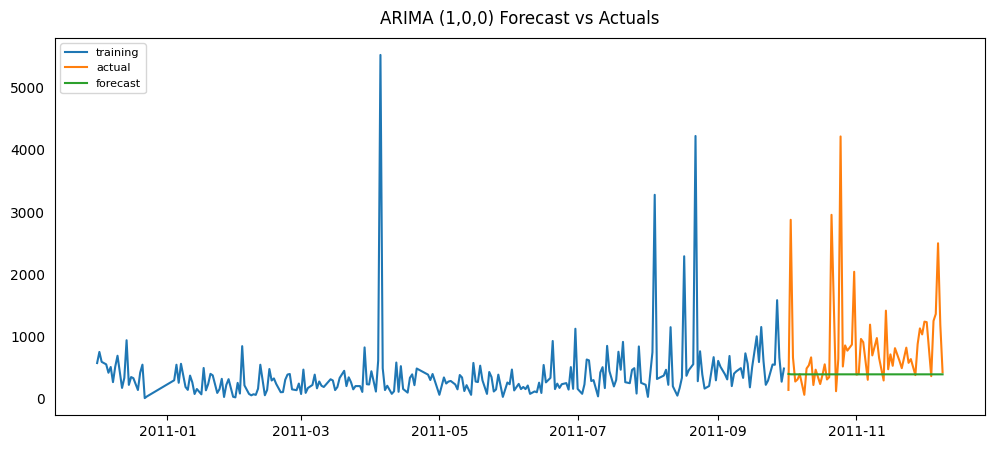

In [728]:
arimaclk_model100 = ARIMA(train, order=(1, 0, 0)) 
fitted_arimaclk100 = arimaclk_model100.fit() 
# Forecast
result_clk100=fitted_arimaclk100.forecast(60, alpha=0.05) # 95% conf
#result_clk.to_frame()
results_indexed100=pd.DataFrame(result_clk100)
results_indexed100['InvoiceDate']=test.index
results_indexed100['InvoiceDate'] = pd.to_datetime(results_indexed100['InvoiceDate'])   
results_indexed100=results_indexed100.set_index('InvoiceDate')
## Make as pandas series
#fc_series = pd.Series(fc, index=test.index)
#lower_series = pd.Series(conf[:, 0], index=test.index)
#upper_series = pd.Series(conf[:, 1], index=test.index)
## Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(results_indexed100, label='forecast')
#plt.fill_between(lower_series.index, lower_series, upper_series, 
# color='k', alpha=.15)
plt.title('ARIMA (1,0,0) Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
#plt.xlim([pd.Timestamp('2011-10-01'), pd.Timestamp('2011-12-10')])
plt.show()


In [729]:
# Calculating RMSE and MAPE

arima100_rmse = np.sqrt(mean_squared_error(test['Sales'], 
                                        results_indexed100['predicted_mean'])).round(2)
arima100_mape = np.round(np.mean(np.abs(test['Sales'] - results_indexed100['predicted_mean'])/test['Sales'])*100,2)

results = pd.DataFrame({'Method':['ARIMA method'], 'MAPE': [arima100_mape], 'RMSE': [arima100_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,ARIMA method,861.07,58.74


**Using auto arima Recommended model: ARIMA(2,0,2)**

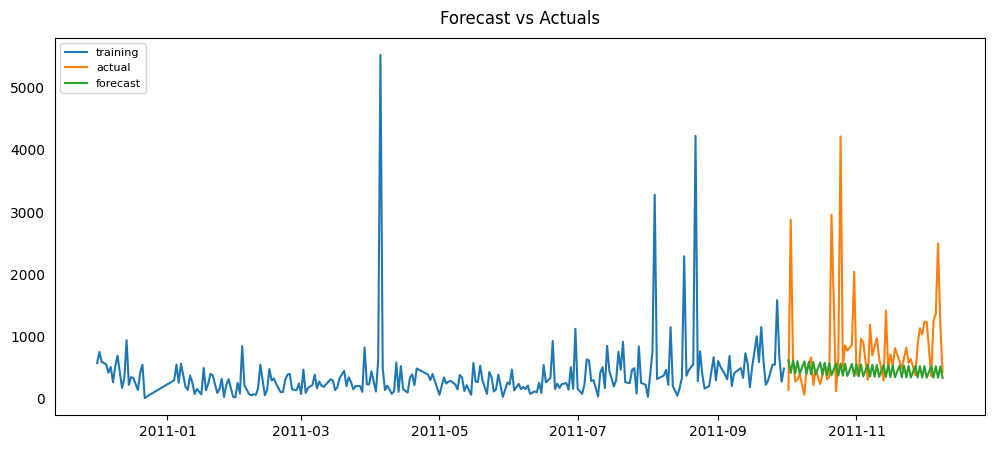

In [713]:
arimaclk_model = ARIMA(train, order=(2, 0, 2)) 
fitted_arimaclk = arimaclk_model.fit() 
# Forecast
result_clk=fitted_arimaclk.forecast(60, alpha=0.05) # 95% conf
#result_clk.to_frame()
results_indexed=pd.DataFrame(result_clk)
results_indexed['InvoiceDate']=test.index
results_indexed['InvoiceDate'] = pd.to_datetime(results_indexed['InvoiceDate'])   
results_indexed=results_indexed.set_index('InvoiceDate')
## Make as pandas series
#fc_series = pd.Series(fc, index=test.index)
#lower_series = pd.Series(conf[:, 0], index=test.index)
#upper_series = pd.Series(conf[:, 1], index=test.index)
## Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(results_indexed, label='forecast')
#plt.fill_between(lower_series.index, lower_series, upper_series, 
# color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
#plt.xlim([pd.Timestamp('2011-10-01'), pd.Timestamp('2011-12-10')])
plt.show()


In [715]:
# Calculating RMSE and MAPE

arima_rmse = np.sqrt(mean_squared_error(test['Sales'], 
                                        results_indexed['predicted_mean'])).round(2)
arima_mape = np.round(np.mean(np.abs(test['Sales'] - results_indexed['predicted_mean'])/test['Sales'])*100,2)

results = pd.DataFrame({'Method':['ARIMA method'], 'MAPE': [arima_mape], 'RMSE': [arima_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,ARIMA method,851.56,75.39


In [731]:
# Table Results

Table = PrettyTable(["Model", "RMSE"])
Table.add_row(["Naive", n_rmse])
Table.add_row(["Simple Average", sa_rmse])
Table.add_row(["Moving Average", ma_rmse])
Table.add_row(["Simple Exponential", se_rmse])
Table.add_row(["Holt Linear", hl_rmse])
Table.add_row(["Holt Winter", hw_rmse])
Table.add_row(["ARIMA (1,0,0)", arima100_rmse])
Table.add_row(["ARIMA (2,0,2)", arima_rmse])
print("Time Series Model Performance Sorted by RMSE")
Table.sortby = "RMSE"
print(Table)

Time Series Model Performance Sorted by RMSE
+--------------------+--------+
|       Model        |  RMSE  |
+--------------------+--------+
|    Holt Winter     | 731.7  |
|    Holt Linear     | 764.49 |
|   Moving Average   | 771.42 |
| Simple Exponential | 812.86 |
|       Naive        | 816.73 |
|   ARIMA (2,0,2)    | 851.56 |
|   Simple Average   | 861.06 |
|   ARIMA (1,0,0)    | 861.07 |
+--------------------+--------+


-----